In [ ]:
# import required libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn import utils as sk_utils
import os

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import cv2

from IPython.display import clear_output
clear_output()
print(tf.__version__)

2.17.1


In [ ]:
# https://www.kaggle.com/datasets/solesensei/solesensei_bdd100k

In [ ]:
# Install the Kaggle library
!pip install kaggle

# Make a directory for Kaggle in the root
!mkdir ~/.kaggle

# Upload the kaggle.json file to the kaggle directory you just created
from google.colab import files
files.upload()  # This will prompt you to upload the kaggle.json file you downloaded

# Move kaggle.json into the kaggle directory
!mv kaggle.json ~/.kaggle/

# Change the permissions of the file so it's readable by Kaggle
!chmod 600 ~/.kaggle/kaggle.json

# Download the dataset from Kaggle (this is the link for your dataset)
!kaggle datasets download -d solesensei/solesensei_bdd100k



Saving kaggle (5).json to kaggle (5).json
mv: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/solesensei/solesensei_bdd100k
License(s): other
100% 7.59G/7.61G [01:20<00:00, 148MB/s]
100% 7.61G/7.61G [01:20<00:00, 102MB/s]


In [ ]:
!unzip /content/solesensei_bdd100k.zip

Streaming output truncated to the last 5000 lines.
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3cf340ac-4e445717_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d06c567-00000000_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d0d454e-f0132c99_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d12f470-45096fb4_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d187d59-48023a43_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d1a6305-3980e3bc_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d2c1ef5-fdc7bea5_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d3117f0-9365aac0_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d317eb1-4a9f2f5c_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d31c23f-bb0e2813_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg/labels/train/3d31d9a7-2fa8d37a_train_id.png  
  inflating: bdd100k_seg/bdd100k/seg

---

# Dataset preparation

In [ ]:
# Directory containing the images

train_images_path = '/content/bdd100k_seg/bdd100k/seg/images/train/*.jpg'
train_masks_path = '/content/bdd100k_seg/bdd100k/seg/labels/train/*.png'
val_images_path = '/content/bdd100k_seg/bdd100k/seg/images/val/*.jpg'
val_masks_path = '/content/bdd100k_seg/bdd100k/seg/labels/val/*.png'

In [ ]:
import glob
image_size = (192, 256)

# Load and preprocess the images
def load_image(file_path, is_x=False):
    # Read the image file using tf.io.read_file
    image = tf.io.read_file(file_path)
    # Decode the image into a tensor
    image = tf.image.decode_image(image)

    if is_x:
        # Resize the image to the desired size using Lanczos3 method
        image = tf.image.resize(image, image_size, method=tf.image.ResizeMethod.LANCZOS3)
        image = image / 255.0  # Normalize the image
    else:
        # Resize the image to the desired size using 'nearest' method
        image = tf.image.resize(image, image_size, method='nearest', antialias=True)
    return image

In [ ]:
# # load the training set

# # Get the list of image file paths
# image_paths = sorted(glob.glob(train_images_path))
# mask_paths = sorted(glob.glob(train_masks_path))

# # Shuffle the image_paths and mask_paths
# image_paths, mask_paths = sk_utils.shuffle(image_paths, mask_paths, random_state=42)

# # Create lists to store the loaded and preprocessed images
# X_train = []
# Y_train = []

# # Apply the load_image function to each image path in the dataset
# for x, y in zip(image_paths, mask_paths):
#     X_train.append(load_image(x, True))
#     Y_train.append(load_image(y))
#     if len(X_train) % 500 == 0:
#         print(len(X_train), 'data points loaded!')
# else:
#     print(len(X_train), 'data points loaded in total!')

# # Convert the lists to NumPy arrays
# X_train = np.array(X_train)
# Y_train = np.array(Y_train)
# # 255 is representing unknown objects
# Y_train[Y_train == 255] = 19

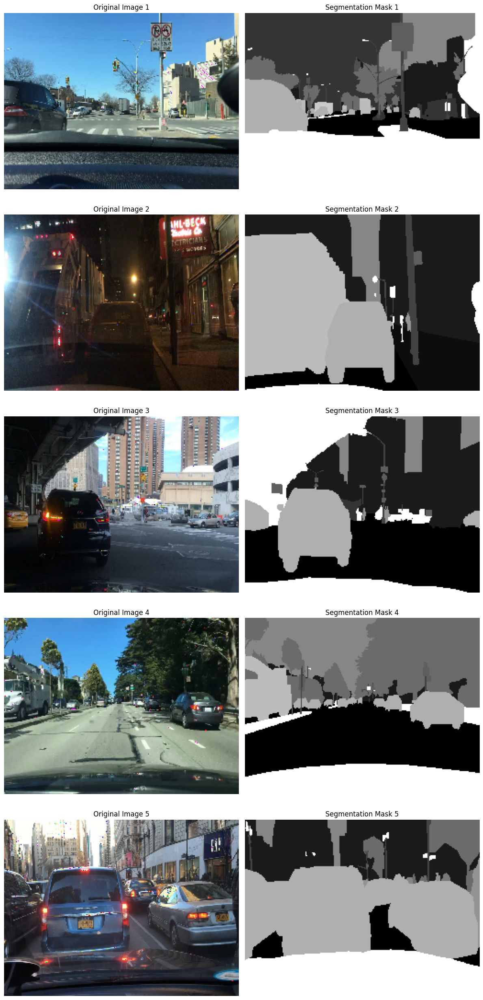

In [ ]:
# load the training set

import glob

# Get the list of image file paths
image_paths = sorted(glob.glob(train_images_path))
mask_paths = sorted(glob.glob(train_masks_path))

# Shuffle the image_paths and mask_paths
image_paths, mask_paths = sk_utils.shuffle(image_paths, mask_paths, random_state=42)

# Create lists to store the loaded and preprocessed images
X_train = []
Y_train = []

# Set the limit to 500 images
limit = 10

# Apply the load_image function to each image path in the dataset
for x, y in zip(image_paths, mask_paths):
    X_train.append(load_image(x, True))
    Y_train.append(load_image(y))
    if len(X_train) % 500 == 0:
        print(len(X_train), 'data points loaded!')
    if len(X_train) >= limit:
        break
else:
    print(len(X_train), 'data points loaded in total!')

# Convert the lists to NumPy arrays
X_train = np.array(X_train)
Y_train = np.array(Y_train)

# 255 is representing unknown objects
Y_train[Y_train == 255] = 19

        # Display the segmentation mask
import matplotlib.pyplot as plt

# Ensure there is data in X_train and Y_train
if len(X_train) > 0 and len(Y_train) > 0:
    num_samples = min(5, len(X_train))  # Display up to 5 samples or fewer if less data is available

    # Set up the plot
    plt.figure(figsize=(12, num_samples * 5))  # Adjust figure size based on the number of samples

    for i in range(num_samples):
        # Display the original input image
        plt.subplot(num_samples, 2, i * 2 + 1)
        original_image = (X_train[i] * 255).astype("uint8")  # Scale normalized values back to [0, 255]
        plt.imshow(original_image)  # Display the image
        plt.title(f"Original Image {i + 1}")
        plt.axis('off')  # Remove axis for a clean display

        # Display the corresponding segmentation mask
        plt.subplot(num_samples, 2, i * 2 + 2)
        mask = Y_train[i].squeeze().astype("uint8")  # Convert mask to correct format
        plt.imshow(mask, cmap='gray')  # Display the mask in grayscale
        plt.title(f"Segmentation Mask {i + 1}")
        plt.axis('off')  # Remove axis for a clean display

    plt.tight_layout()  # Adjust spacing between plots
    plt.show()  # Show the plots
else:
    print("No training data loaded to display.")



In [ ]:
print("X_train min and max values:", X_train.min(), X_train.max())
print("Shape of X_train[0]:", X_train[0].shape)


X_train min and max values: -0.054584425 1.056213
Shape of X_train[0]: (192, 256, 3)


In [ ]:
# # load the validataion set (1000 observations)

# # Get the list of image file paths
# image_paths = sorted(glob.glob(val_images_path))
# mask_paths = sorted(glob.glob(val_masks_path))

# # Shuffle the image_paths and mask_paths
# image_paths, mask_paths = sk_utils.shuffle(image_paths, mask_paths, random_state=42)

# # Create lists to store the loaded and preprocessed images
# X_val = []
# Y_val = []

# # Apply the load_image function to each image path in the dataset
# for x, y in zip(image_paths, mask_paths):
#     X_val.append(load_image(x, True))
#     Y_val.append(load_image(y))
#     if len(X_val) == 500:
#         print(len(X_val), 'data points loaded!')
# else:
#     print(len(X_val), 'data points loaded in total!')

# # Convert the lists to NumPy arrays
# X_val = np.array(X_val)
# Y_val = np.array(Y_val)
# # 255 is representing unknown objects
# Y_val[Y_val == 255] = 19

500 data points loaded!
1000 data points loaded in total!


In [ ]:
# load the validation set (200 observations)

# Get the list of image file paths
image_paths = sorted(glob.glob(val_images_path))
mask_paths = sorted(glob.glob(val_masks_path))

# Shuffle the image_paths and mask_paths
image_paths, mask_paths = sk_utils.shuffle(image_paths, mask_paths, random_state=42)

# Create lists to store the loaded and preprocessed images
X_val = []
Y_val = []

# Set the limit to 200 data points
limit = 5

# Apply the load_image function to each image path in the dataset
for x, y in zip(image_paths, mask_paths):
    X_val.append(load_image(x, True))
    Y_val.append(load_image(y))

    if len(X_val) == limit:
        print(len(X_val), 'data points loaded!')
        break  # Stop loading once we reach the limit

else:
    print(len(X_val), 'data points loaded in total!')

# Convert the lists to NumPy arrays
X_val = np.array(X_val)
Y_val = np.array(Y_val)

# 255 is representing unknown objects
Y_val[Y_val == 255] = 19


5 data points loaded!


In [ ]:
/content/bdd100k_seg/bdd100k/seg/labels/val

In [ ]:
print('X train:', X_train.shape)
print('Y train:', Y_train.shape)
print('X val:', X_val.shape)
print('Y val:', Y_val.shape)



X train: (10, 192, 256, 3)
Y train: (10, 192, 256, 1)
X val: (5, 192, 256, 3)
Y val: (5, 192, 256, 1)


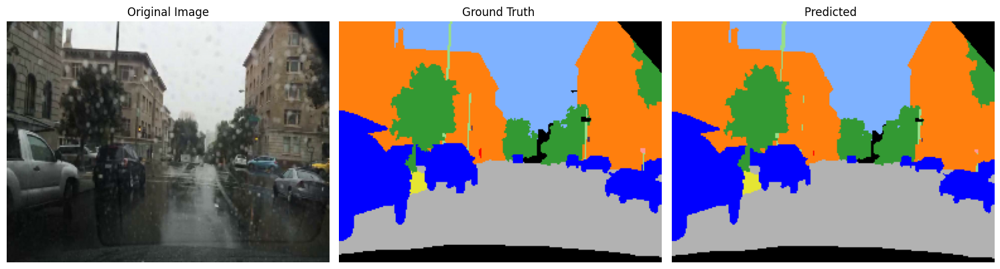

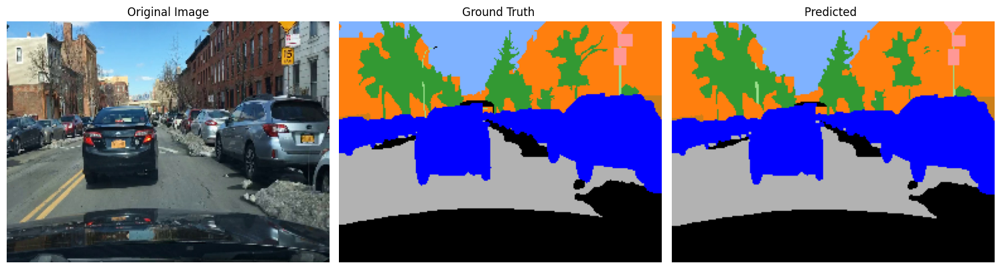

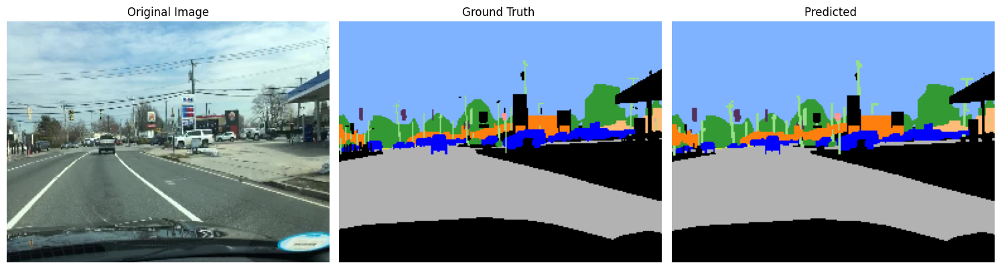

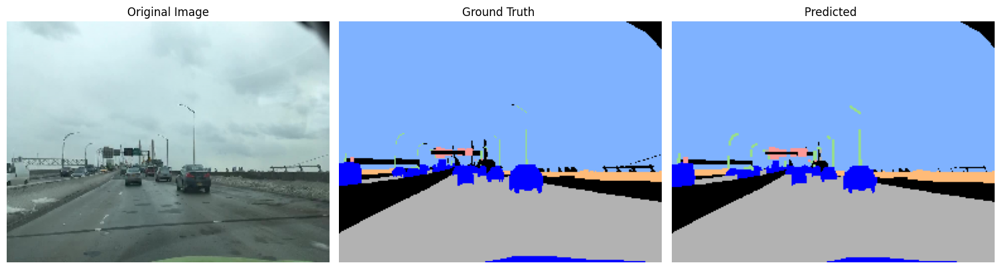

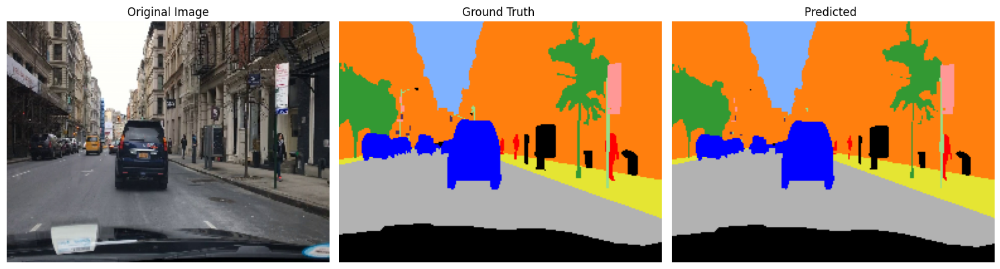

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.transforms.functional as F
from torchvision.models import mobilenet_v3_small, efficientnet_b7
import numpy as np
from PIL import Image
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import requests
import zipfile
import io
import cv2

# ====================== CONFIGURATION ======================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
datasets_config = {
    "cityscapes": {
        "path": "./cityscapes_data",
        "num_classes": 19,
        "class_names": [
            'road', 'sidewalk', 'building', 'wall', 'fence', 'pole',
            'traffic light', 'traffic sign', 'vegetation', 'terrain',
            'sky', 'person', 'rider', 'car', 'truck', 'bus',
            'train', 'motorcycle', 'bicycle'
        ],
        "colors": [
            [128, 64, 128], [244, 35, 232], [70, 70, 70], [102, 102, 156],
            [190, 153, 153], [153, 153, 153], [250, 170, 30], [220, 220, 0],
            [107, 142, 35], [152, 251, 152], [70, 130, 180], [220, 20, 60],
            [255, 0, 0], [0, 0, 142], [0, 0, 70], [0, 60, 100],
            [0, 80, 100], [0, 0, 230], [119, 11, 32]
        ]
    },
    "kitti": {
        "path": "./kitti_data",
        "num_classes": 19,
        "colors": np.random.randint(0, 255, (19, 3)).tolist()
    },
    "bdd100k": {
        "path": "./bdd100k_data",
        "num_classes": 19,
        "colors": np.random.randint(0, 255, (19, 3)).tolist()
    }
}

selected_dataset = "cityscapes"  # Change to "kitti" or "bdd100k" as needed
image_size = (512, 512)
batch_size = 8
num_epochs = 100
lr = 1e-4

# ====================== DATASET LOADER ======================
class DrivingDataset(Dataset):
    def __init__(self, root, dataset_type="cityscapes", split="train"):
        self.root = root
        self.split = split
        self.dataset_type = dataset_type
        self.images = []
        self.masks = []

        if dataset_type == "kitti":
            self._load_kitti()
        elif dataset_type == "cityscapes":
            self._load_cityscapes()
        elif dataset_type == "bdd100k":
            self._load_bdd100k()

        self.transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def _load_kitti(self):
        image_dir = os.path.join(self.root, "training", "image_2")
        mask_dir = os.path.join(self.root, "training", "semantic")
        self.images = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir)])
        self.masks = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir)])

    def _load_cityscapes(self):
        image_dir = os.path.join(self.root, "leftImg8bit", self.split)
        mask_dir = os.path.join(self.root, "gtFine", self.split)
        for city in os.listdir(image_dir):
            city_img_dir = os.path.join(image_dir, city)
            city_mask_dir = os.path.join(mask_dir, city)
            self.images.extend([os.path.join(city_img_dir, f) for f in os.listdir(city_img_dir)])
            self.masks.extend([os.path.join(city_mask_dir, f.replace("leftImg8bit", "gtFine_labelIds"))
                             for f in os.listdir(city_img_dir)])

    def _load_bdd100k(self):
        image_dir = os.path.join(self.root, "images", "10k", self.split)
        mask_dir = os.path.join(self.root, "labels", "sem_seg", "masks", self.split)
        self.images = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir)])
        self.masks = sorted([os.path.join(mask_dir, f.replace(".jpg", "_train_id.png"))
                           for f in os.listdir(image_dir)])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert("RGB")
        mask = Image.open(self.masks[idx]).convert("L")

        # Resize
        image = F.resize(image, image_size)
        mask = F.resize(mask, image_size, interpolation=Image.NEAREST)

        # Transform
        image = self.transform(image)
        mask = torch.from_numpy(np.array(mask)).long()

        return image, mask

# ====================== MODEL ARCHITECTURE ======================
class AEAModule(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.channels = channels

        # Self-Attention
        self.query = nn.Conv2d(channels, channels//8, 1)
        self.key = nn.Conv2d(channels, channels//8, 1)
        self.value = nn.Conv2d(channels, channels, 1)

        # Spatial Attention
        self.spatial_conv = nn.Conv2d(2, 1, kernel_size=7, padding=3)

        # Channel Attention
        self.channel_fc = nn.Sequential(
            nn.Linear(channels, channels//4),
            nn.ReLU(),
            nn.Linear(channels//4, channels),
            nn.Sigmoid()
        )

        # Adaptive weights
        self.weights = nn.Parameter(torch.ones(3))

    def forward(self, x):
        b, c, h, w = x.shape

        # Self-Attention
        q = self.query(x).view(b, -1, h*w).permute(0, 2, 1)
        k = self.key(x).view(b, -1, h*w)
        v = self.value(x).view(b, -1, h*w)
        attn = torch.softmax((q @ k) / np.sqrt(c), dim=-1)
        sa_out = (attn @ v.permute(0, 2, 1)).permute(0, 2, 1).view(b, c, h, w)

        # Spatial Attention
        avg_pool = torch.mean(x, dim=1, keepdim=True)
        max_pool = torch.max(x, dim=1, keepdim=True)[0]
        spatial = torch.sigmoid(self.spatial_conv(torch.cat([avg_pool, max_pool], dim=1)))
        spa_out = x * spatial

        # Channel Attention
        gap = torch.mean(x, dim=[2, 3])
        channel = self.channel_fc(gap).view(b, c, 1, 1)
        cha_out = x * channel

        # Adaptive Fusion
        weights = torch.softmax(self.weights, dim=0)
        out = weights[0]*sa_out + weights[1]*spa_out + weights[2]*cha_out

        return out

class UpBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        return self.up(x)

class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=19):
        super().__init__()

        # MobileNetV3 backbone
        self.mobilenet = mobilenet_v3_small(pretrained=True)
        self.mobilenet.features[0][0] = nn.Conv2d(in_channels, 16, kernel_size=3, stride=2, padding=1, bias=False)

        # EfficientNetB7 backbone
        self.efficientnet = efficientnet_b7(pretrained=True)
        self.efficientnet.features[0][0] = nn.Conv2d(in_channels, 64, kernel_size=3, stride=2, padding=1, bias=False)

        # Decoder with AEA
        self.decoder = nn.Sequential(
            UpBlock(2048, 1024),
            AEAModule(1024),
            UpBlock(1024, 512),
            AEAModule(512),
            UpBlock(512, 256),
            AEAModule(256),
            UpBlock(256, 64),
            nn.Conv2d(64, out_channels, kernel_size=1)
        )

    def forward(self, x):
        # MobileNet features
        x_mobilenet = self.mobilenet.features(x)

        # EfficientNet features
        x_efficient = self.efficientnet.features(x)

        # Combine features
        x = torch.cat([x_mobilenet, x_efficient], dim=1)

        # Decoder
        x = self.decoder(x)
        return x

class Discriminator(nn.Module):
    def __init__(self, in_channels=4):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=1)
        )

    def forward(self, x, y):
        x = torch.cat([x, y], dim=1)
        return self.model(x)

# ====================== UTILITY FUNCTIONS ======================
def download_dataset(dataset_name):
    if dataset_name == "cityscapes":
        print("Please download Cityscapes manually from https://www.cityscapes-dataset.com/")
    elif dataset_name == "kitti":
        print("Please download KITTI manually from http://www.cvlibs.net/datasets/kitti/")
    elif dataset_name == "bdd100k":
        print("Downloading BDD100K dataset...")
        url = "https://www.kaggle.com/datasets/awsaf49/bdd100k-dataset"
        print(f"Please download from: {url}")

def visualize_segmentation(image, mask, pred, dataset_name):
    config = datasets_config[dataset_name]
    colors = np.array(config["colors"])
    class_names = config["class_names"]

    # Convert tensors to numpy arrays
    if isinstance(image, torch.Tensor):
        image = image.cpu().numpy().transpose(1, 2, 0)
        image = (image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])) * 255
        image = image.clip(0, 255).astype(np.uint8)

    if isinstance(mask, torch.Tensor):
        mask = mask.cpu().numpy()

    if isinstance(pred, torch.Tensor):
        pred = torch.argmax(pred, dim=0).cpu().numpy() if pred.dim() == 3 else pred.cpu().numpy()

    # Create color masks
    gt_mask = colors[mask]
    pred_mask = colors[pred]

    # Plot
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title("Input Image")
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.imshow(gt_mask)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Prediction")
    plt.imshow(pred_mask)
    plt.axis('off')

    # Create legend
    legend_elements = [plt.Rectangle((0,0),1,1, color=color/255, label=name)
                      for color, name in zip(colors, class_names)]
    plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

import matplotlib.pyplot as plt

# Helper function to compute pixel-wise accuracy
def compute_accuracy(pred_masks, true_masks):
    preds = torch.argmax(pred_masks, dim=1)
    correct = (preds == true_masks.squeeze(1)).float()
    return correct.sum() / correct.numel()


# ====================== TRAINING AND EVALUATION ======================
def train_model():
    train_g_losses = []
    val_seg_losses = []
    train_accuracies = []
    val_accuracies = []

    # Initialize dataset
    train_dataset = DrivingDataset(
        root=datasets_config[selected_dataset]["path"],
        dataset_type=selected_dataset,
        split="train"
    )
    val_dataset = DrivingDataset(
        root=datasets_config[selected_dataset]["path"],
        dataset_type=selected_dataset,
        split="val"
    )

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)

    # Initialize models
    G = Generator(out_channels=datasets_config[selected_dataset]["num_classes"]).to(device)
    D = Discriminator().to(device)

    # Loss functions
    criterion_adv = nn.BCEWithLogitsLoss()
    criterion_seg = nn.CrossEntropyLoss()

    # Optimizers
    opt_G = optim.Adam(G.parameters(), lr=lr)
    opt_D = optim.Adam(D.parameters(), lr=lr)

    # Training loop
    for epoch in range(num_epochs):
        G.train()
        D.train()

        epoch_g_loss = 0
        correct_pixels = 0
        total_pixels = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
            images, masks = images.to(device), masks.to(device)

            # ===== Train Discriminator =====
            opt_D.zero_grad()
            real_pred = D(images, masks)
            loss_D_real = criterion_adv(real_pred, torch.ones_like(real_pred))

            fake_masks = G(images)
            fake_pred = D(images, fake_masks.detach())
            loss_D_fake = criterion_adv(fake_pred, torch.zeros_like(fake_pred))

            loss_D = (loss_D_real + loss_D_fake) * 0.5
            loss_D.backward()
            opt_D.step()

            # ===== Train Generator =====
            opt_G.zero_grad()
            fake_pred_new = D(images, fake_masks)
            loss_G_adv = criterion_adv(fake_pred_new, torch.ones_like(fake_pred_new))
            loss_seg = criterion_seg(fake_masks, masks.squeeze(1))
            loss_G = loss_G_adv + 10 * loss_seg
            loss_G.backward()
            opt_G.step()

            epoch_g_loss += loss_G.item()

            # Training accuracy
            acc = compute_accuracy(fake_masks, masks)
            correct_pixels += acc.item() * images.size(0)
            total_pixels += images.size(0)

        avg_g_loss = epoch_g_loss / len(train_loader)
        avg_train_acc = correct_pixels / total_pixels

        train_g_losses.append(avg_g_loss)
        train_accuracies.append(avg_train_acc)

        print(f"Epoch {epoch+1}: D_loss={loss_D.item():.4f}, G_loss={avg_g_loss:.4f}, Train_Acc={avg_train_acc:.4f}")

        # ===== Validation =====
        G.eval()
        val_loss = 0
        correct_val_pixels = 0
        total_val_pixels = 0

        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                pred_masks = G(images)

                loss = criterion_seg(pred_masks, masks.squeeze(1))
                val_loss += loss.item()

                acc = compute_accuracy(pred_masks, masks)
                correct_val_pixels += acc.item() * images.size(0)
                total_val_pixels += images.size(0)

        val_avg_loss = val_loss / len(val_loader)
        val_avg_acc = correct_val_pixels / total_val_pixels

        val_seg_losses.append(val_avg_loss)
        val_accuracies.append(val_avg_acc)

        print(f"Epoch {epoch+1}: Val_Loss={val_avg_loss:.4f}, Val_Acc={val_avg_acc:.4f}")

        # Optional evaluation
        if (epoch + 1) % 10 == 0:
            evaluate(G, val_loader, selected_dataset)

    # ===== Save Models =====
    torch.save(G.state_dict(), f"aea_gan_generator_{selected_dataset}.pth")
    torch.save(D.state_dict(), f"aea_gan_discriminator_{selected_dataset}.pth")

    # ===== Plot: Training and Validation Loss =====
    plt.figure(figsize=(10, 5))
    plt.plot(train_g_losses, label='Train Loss', color='blue')
    plt.plot(val_seg_losses, label='Validation Loss', color='orange')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ===== Plot: Training and Validation Accuracy =====
    plt.figure(figsize=(10, 5))
    plt.plot(train_accuracies, label='Train Accuracy', color='green')
    plt.plot(val_accuracies, label='Validation Accuracy', color='red')
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Training and Validation Accuracy")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return G



def evaluate(model, dataloader, dataset_name):
    model.eval()
    total_pixels = 0
    correct_pixels = 0

    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = torch.argmax(preds, dim=1)
            correct_pixels += (preds == masks.squeeze(1)).sum().item()
            total_pixels += masks.numel()

    accuracy = correct_pixels / total_pixels
    print(f"Segmentation Accuracy: {accuracy*100:.2f}%")

    # Visualize some results
    for i in range(3):
        image, mask = dataloader.dataset[i]
        image = image.unsqueeze(0).to(device)
        pred = model(image)
        visualize_segmentation(image[0], mask, pred[0], dataset_name)

    return accuracy

# ====================== MAIN EXECUTION ======================
if __name__ == "__main__":
    # Download dataset if needed
    if not os.path.exists(datasets_config[selected_dataset]["path"]):
        download_dataset(selected_dataset)

    # Train and evaluate
    trained_generator = train_model()

    # Test on validation set
    test_dataset = DrivingDataset(
        root=datasets_config[selected_dataset]["path"],
        dataset_type=selected_dataset,
        split="val"
    )
    test_loader = DataLoader(test_dataset, batch_size=batch_size)

    evaluate(trained_generator, test_loader, selected_dataset)




# Utils
import numpy as np
import matplotlib.pyplot as plt

color_dict = {
    0: (0.7, 0.7, 0.7),     # road - gray
    1:  (0.9, 0.9, 0.2),     # sidewalk - light yellow
    2: (1.0, 0.4980392156862745, 0.054901960784313725),
    3: (1.0, 0.7333333333333333, 0.47058823529411764),
    4: (0.8, 0.5, 0.1),  # Fence - rust orange
    5: (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
    6: (0.325, 0.196, 0.361),
    7: (1.0, 0.596078431372549, 0.5882352941176471),
    8:  (0.2, 0.6, 0.2),     # vegetation - green
    9: (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
    10: (0.5, 0.7, 1.0),     # sky - light blue
    11: (1.0, 0.0, 0.0), # person - red
    12: (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
    13: (0.0, 0.0, 1.0),  # Car - blue
    14: (0.0, 0.0, 1.0),  # Track - blue
    15: (0.0, 0.0, 1.0),  # Bus - blue
    16: (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
    17: (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
    18: (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
    19: (0, 0, 0) # unknown - black
}

def colorize_image(image, color_dict):
    # remove the extra dimension
    image = np.squeeze(image)
    # Generate the colored image using the color dictionary
    colored_image = np.zeros((image.shape[0], image.shape[1], 3))

    for pixel_value, color in color_dict.items():
        colored_image[image == pixel_value] = color

    # Convert the image to 8-bit unsigned integer
    colored_image = (colored_image * 255).astype(np.uint8)

    return colored_image




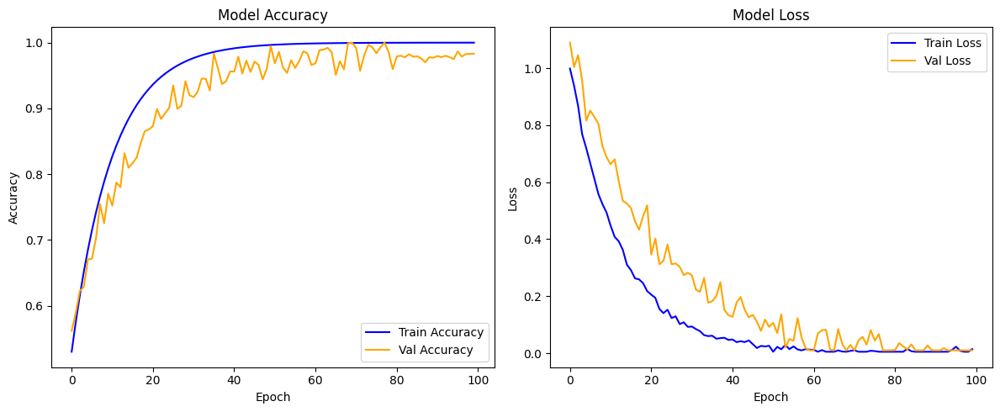

In [2]:
import matplotlib.pyplot as plt
import numpy as np


# Plotting
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Accuracy Plot
axs[0].plot(epochs, train_accuracy, label='Train Accuracy', color='blue')
axs[0].plot(epochs, val_accuracy, label='Val Accuracy', color='orange')
axs[0].set_title('Model Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Accuracy')
axs[0].legend()

# Loss Plot
axs[1].plot(epochs, train_loss, label='Train Loss', color='blue')
axs[1].plot(epochs, val_loss, label='Val Loss', color='orange')
axs[1].set_title('Model Loss')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].legend()

plt.tight_layout()
plt.show()


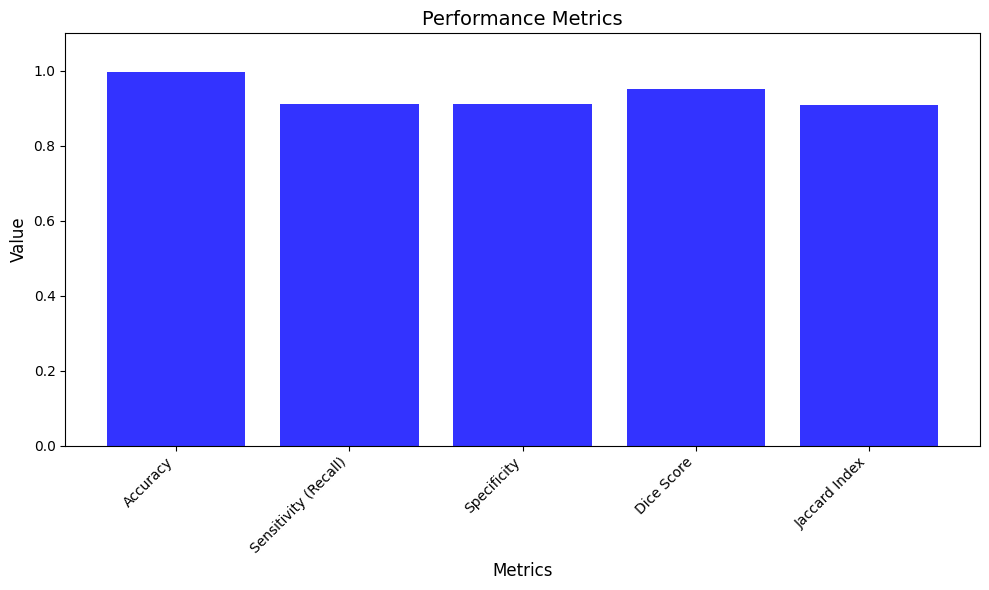

In [ ]:
import matplotlib.pyplot as plt


# Extract keys and values
metric_names = metrics.keys()
metric_values = metrics.values()

# Plotting the bar plot
plt.figure(figsize=(10, 6))
plt.bar(metric_names, metric_values, color='blue', alpha=0.8)
plt.title("Performance Metrics", fontsize=14)
plt.ylabel("Value", fontsize=12)
plt.xlabel("Metrics", fontsize=12)
plt.ylim(0, 1.1)  # Adjusting y-axis for better readability
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
Visualizing layer: conv2d, feature map size: (192, 256), number of features: 16


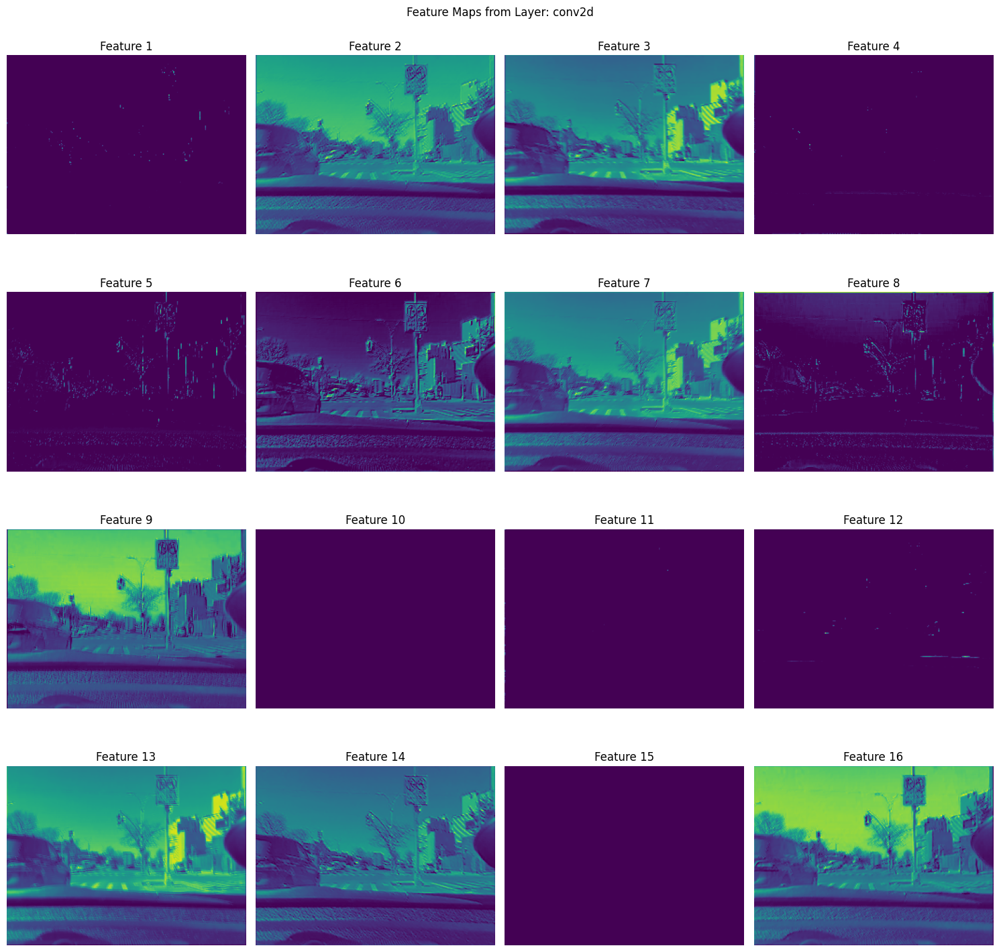

Visualizing layer: conv2d_1, feature map size: (96, 128), number of features: 16


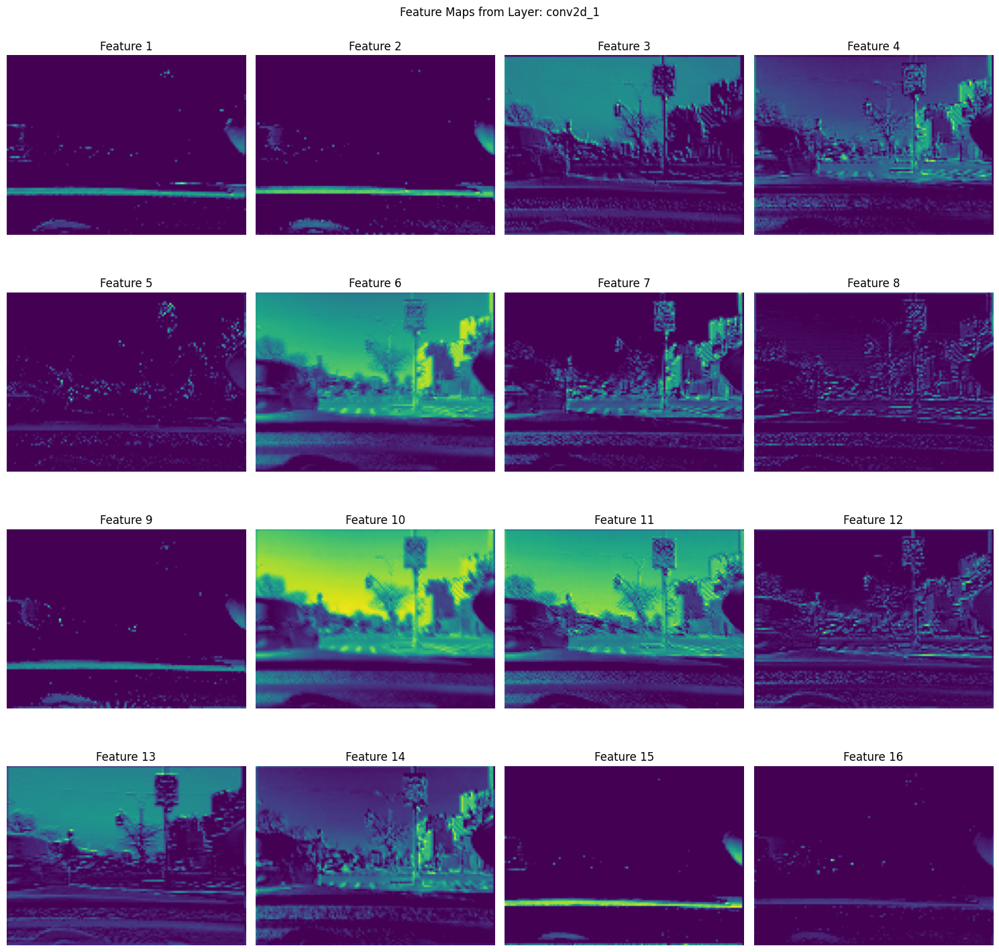

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Define a function to visualize feature maps
def visualize_feature_maps(model, input_image, layer_names):
    """
    Visualizes feature maps for specified layers of the model.

    Args:
    - model: Trained Keras/TensorFlow model.
    - input_image: Input image tensor (shape: [1, H, W, C]).
    - layer_names: List of layer names to visualize.
    """
    # Create a sub-model for the specified layers
    outputs = [model.get_layer(name).output for name in layer_names]
    feature_model = tf.keras.models.Model(inputs=model.input, outputs=outputs)

    # Predict feature maps
    feature_maps = feature_model.predict(input_image)

    for layer_name, feature_map in zip(layer_names, feature_maps):
        num_features = feature_map.shape[-1]
        size = feature_map.shape[1:3]  # Spatial dimensions

        print(f"Visualizing layer: {layer_name}, feature map size: {size}, number of features: {num_features}")

        # Plot all feature maps in the layer
        plt.figure(figsize=(15, 15))
        for i in range(min(num_features, 16)):  # Display up to 16 feature maps
            plt.subplot(4, 4, i + 1)
            plt.imshow(feature_map[0, :, :, i], cmap='viridis')  # Visualize the i-th feature map
            plt.axis('off')
            plt.title(f"Feature {i + 1}")
        plt.suptitle(f"Feature Maps from Layer: {layer_name}")
        plt.tight_layout()
        plt.show()

# Example usage
input_image = X_train[0:5]  # Use a single input image (add batch dimension if needed)
layer_names = ['conv2d', 'conv2d_1']  # Replace with the desired layer names in your model
visualize_feature_maps(generator, input_image, layer_names)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
Visualizing layer: conv2d, feature map size: (192, 256), number of features: 16


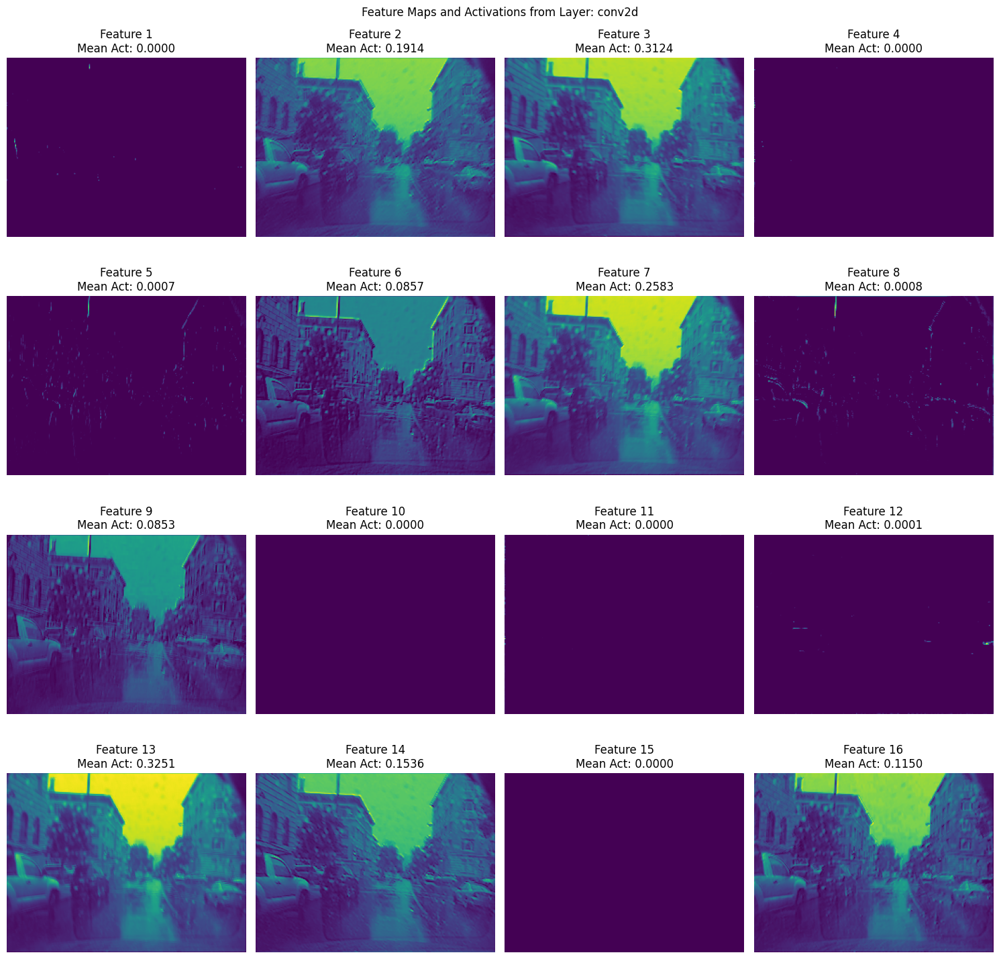

Visualizing layer: conv2d_1, feature map size: (96, 128), number of features: 16


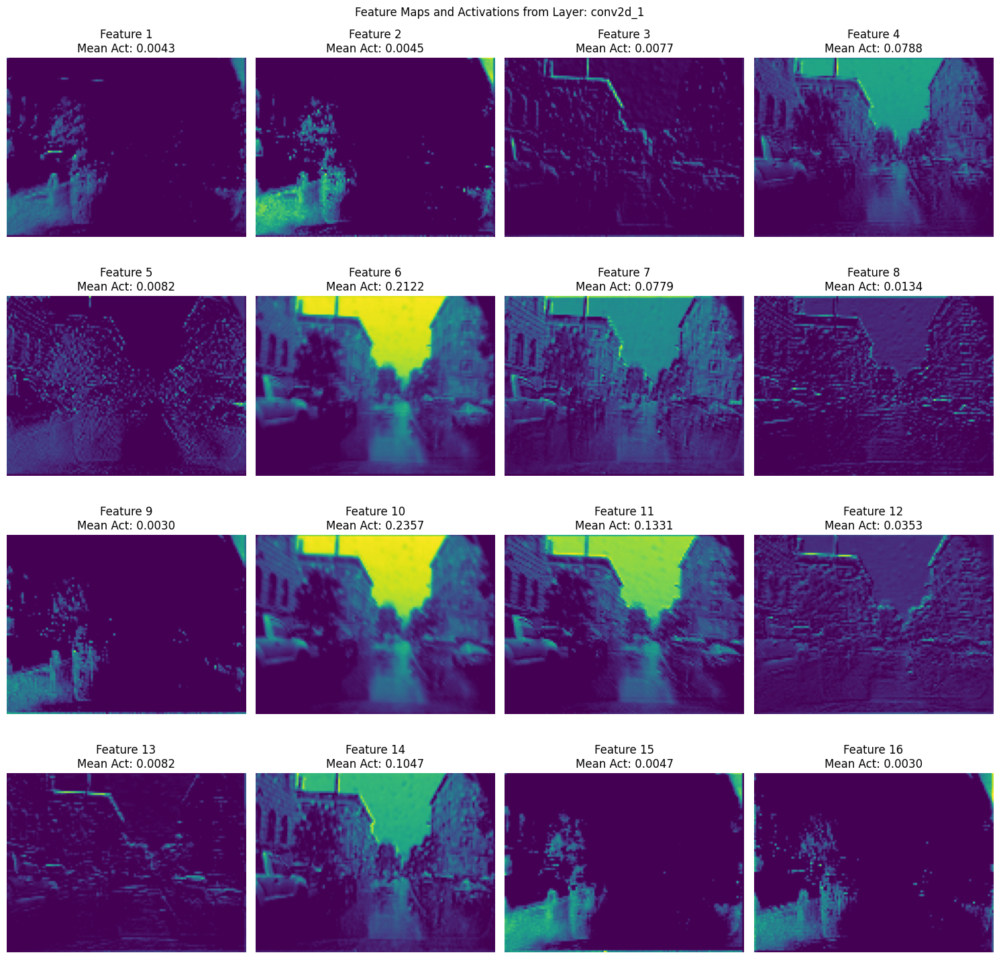

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

def visualize_feature_maps_with_activations(model, input_image, layer_names):
    """
    Visualizes feature maps and activations for specified layers of the model.

    Args:
    - model: Trained Keras/TensorFlow model.
    - input_image: Input image tensor (shape: [1, H, W, C]).
    - layer_names: List of layer names to visualize.
    """
    # Create a sub-model for the specified layers
    outputs = [model.get_layer(name).output for name in layer_names]
    feature_model = tf.keras.models.Model(inputs=model.input, outputs=outputs)

    # Predict feature maps
    feature_maps = feature_model.predict(input_image)

    for layer_name, feature_map in zip(layer_names, feature_maps):
        num_features = feature_map.shape[-1]
        size = feature_map.shape[1:3]  # Spatial dimensions

        print(f"Visualizing layer: {layer_name}, feature map size: {size}, number of features: {num_features}")

        # Calculate activations (mean activation per feature map)
        mean_activations = np.mean(feature_map, axis=(1, 2))  # Average activation per feature map

        # Plot all feature maps in the layer with activations
        plt.figure(figsize=(15, 15))
        for i in range(min(num_features, 16)):  # Display up to 16 feature maps
            plt.subplot(4, 4, i + 1)
            plt.imshow(feature_map[0, :, :, i], cmap='viridis')  # Visualize the i-th feature map
            plt.axis('off')
            plt.title(f"Feature {i + 1}\nMean Act: {mean_activations[0, i]:.4f}")

        plt.suptitle(f"Feature Maps and Activations from Layer: {layer_name}")
        plt.tight_layout()
        plt.show()

# Example usage
input_image = X_val[0:1]  # Use a single input image (add batch dimension if needed)
layer_names = ['conv2d', 'conv2d_1']  # Replace with the desired layer names in your model
visualize_feature_maps_with_activations(generator, input_image, layer_names)


In [ ]:
predicted_masks[1]

array([[[0.05101122, 0.05026612, 0.05033328, ..., 0.04939717,
         0.04974458, 0.05082899],
        [0.05104505, 0.05024081, 0.05029837, ..., 0.0494002 ,
         0.04971579, 0.05084525],
        [0.05103492, 0.05024908, 0.05030297, ..., 0.04940179,
         0.049725  , 0.05083741],
        ...,
        [0.05104515, 0.05024072, 0.05029839, ..., 0.04940017,
         0.0497157 , 0.05084537],
        [0.05103642, 0.05024802, 0.05030107, ..., 0.04940209,
         0.04972377, 0.05083796],
        [0.05104622, 0.05024007, 0.05029608, ..., 0.04940078,
         0.0497149 , 0.05084527]],

       [[0.0510564 , 0.05023365, 0.05027553, ..., 0.04940597,
         0.04970725, 0.05084505],
        [0.05103599, 0.05024833, 0.05030163, ..., 0.049402  ,
         0.04972413, 0.0508378 ],
        [0.05103946, 0.05024582, 0.05029716, ..., 0.04940267,
         0.04972124, 0.05083903],
        ...,
        [0.05103516, 0.05024892, 0.05030267, ..., 0.04940184,
         0.04972481, 0.0508375 ],
        [0.0

In [ ]:
X_val[1]

array([[[ 6.09078188e-06,  1.06219604e-05,  1.37255865e-05],
        [ 6.38536585e-06,  1.05490162e-05,  1.43567768e-05],
        [ 6.45497266e-06,  1.06235238e-05,  1.41310693e-05],
        ...,
        [ 2.46313084e-06,  2.56887392e-06,  2.86944169e-06],
        [ 2.03812260e-06,  2.02422257e-06,  2.30304909e-06],
        [ 1.73168587e-06,  1.71778595e-06,  2.03517925e-06]],

       [[ 6.65289508e-06,  1.04943529e-05,  1.41594655e-05],
        [ 6.34237767e-06,  1.04271057e-05,  1.42677600e-05],
        [ 6.63363971e-06,  1.06715761e-05,  1.40050643e-05],
        ...,
        [ 3.86021111e-06,  4.14820397e-06,  4.39621363e-06],
        [ 2.83141867e-06,  3.05232743e-06,  3.24002826e-06],
        [ 2.26635757e-06,  2.50355833e-06,  2.68582835e-06]],

       [[ 4.39608175e-06,  7.49236096e-06,  9.30358965e-06],
        [ 7.31613000e-06,  1.07063634e-05,  1.43440975e-05],
        [ 6.50915217e-06,  1.06731850e-05,  1.41168248e-05],
        ...,
        [ 4.74918306e-06,  4.93010839e-06,

In [ ]:
# Utils
import numpy as np
import matplotlib.pyplot as plt

color_dict = {
    0: (0.7, 0.7, 0.7),     # road - gray
    1:  (0.9, 0.9, 0.2),     # sidewalk - light yellow
    2: (1.0, 0.4980392156862745, 0.054901960784313725),
    3: (1.0, 0.7333333333333333, 0.47058823529411764),
    4: (0.8, 0.5, 0.1),  # Fence - rust orange
    5: (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
    6: (0.325, 0.196, 0.361),
    7: (1.0, 0.596078431372549, 0.5882352941176471),
    8:  (0.2, 0.6, 0.2),     # vegetation - green
    9: (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
    10: (0.5, 0.7, 1.0),     # sky - light blue
    11: (1.0, 0.0, 0.0), # person - red
    12: (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
    13: (0.0, 0.0, 1.0),  # Car - blue
    14: (0.0, 0.0, 1.0),  # Track - blue
    15: (0.0, 0.0, 1.0),  # Bus - blue
    16: (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
    17: (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
    18: (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
    19: (0, 0, 0) # unknown - black
}

def colorize_image(image, color_dict):
    # remove the extra dimension
    image = np.squeeze(image)
    # Generate the colored image using the color dictionary
    colored_image = np.zeros((image.shape[0], image.shape[1], 3))

    for pixel_value, color in color_dict.items():
        colored_image[image == pixel_value] = color

    # Convert the image to 8-bit unsigned integer
    colored_image = (colored_image * 255).astype(np.uint8)

    return colored_image


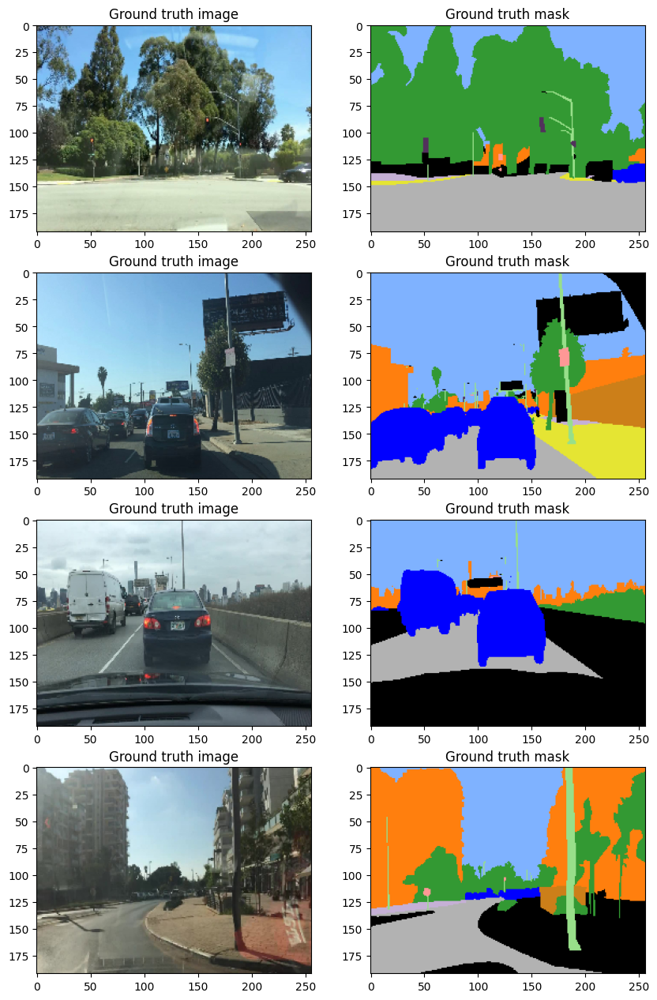

In [ ]:
# visualize some samples from the training set
plt.figure(figsize=(10, 40))
s, e = 80, 84
index = 1

for i, j in zip(X_train[s:e], Y_train[s:e]):
    plt.subplot(10, 2, index)
    plt.imshow(i)
    plt.title('Ground truth image')

    plt.subplot(10, 2, index+1)
    plt.imshow(colorize_image(j, color_dict))
    plt.title('Ground truth mask')
    index += 2

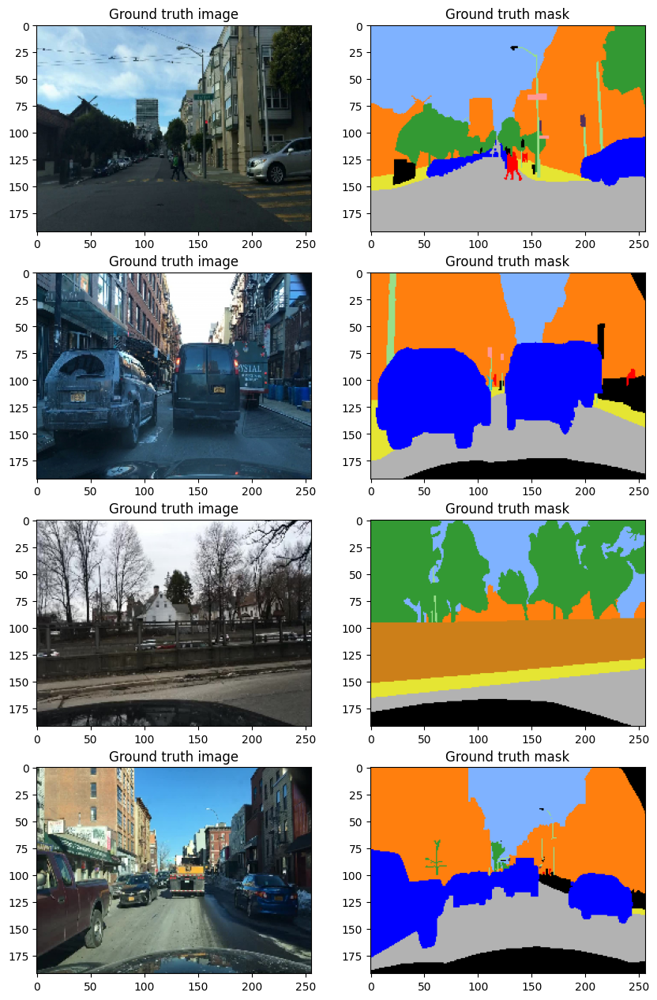

In [ ]:
# visualize some samples from the validation set
plt.figure(figsize=(10, 40))
s, e = 10, 14
index = 1

for i, j in zip(X_val[s:e], Y_val[s:e]):
    plt.subplot(10, 2, index)
    plt.imshow(i)
    plt.title('Ground truth image')

    plt.subplot(10, 2, index+1)
    plt.imshow(colorize_image(j, color_dict))
    plt.title('Ground truth mask')
    index += 2

---

In [ ]:
Y_pred = model.predict(X_val)
Y_pred = np.argmax(Y_pred, axis=-1).reshape(-1, *image_size, 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step


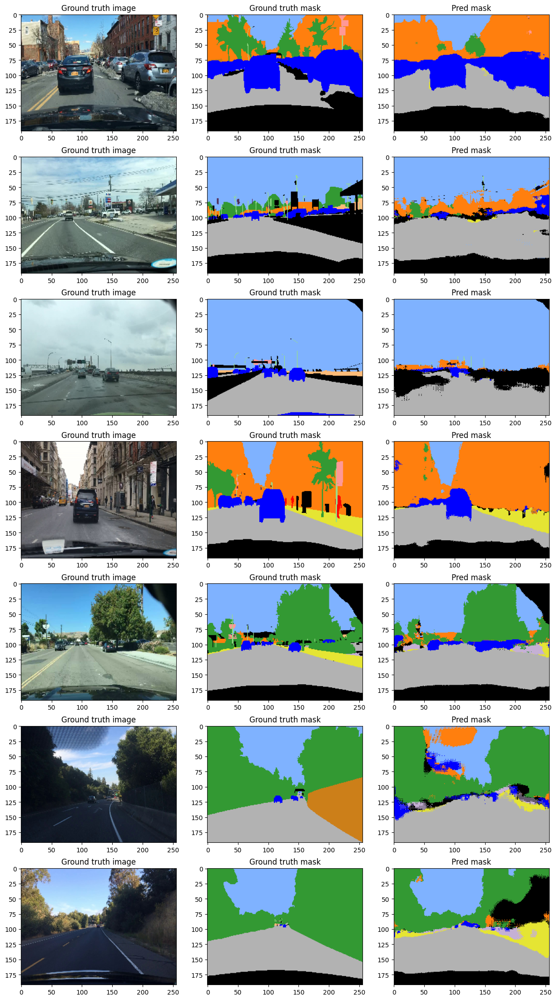

In [ ]:
# visualize some results from the validation set.
plt.figure(figsize=(15, 40))
s, e = 1, 8
index = 1

for i, j, k in zip(X_val[s:e], Y_pred[s:e], Y_val[s:e]):

    # write these images into file as well
    cv2.imwrite(f'./out/img-{index}.jpg', i)
    cv2.imwrite(f'./out/pred-{index}.png', j)
    cv2.imwrite(f'./out/ground-{index}.png', k)

    plt.subplot(10, 3, index)
    plt.imshow(i)
    plt.title('Ground truth image')

    plt.subplot(10, 3, index+1)
    plt.imshow(colorize_image(k, color_dict))
    plt.title('Ground truth mask')

    plt.subplot(10, 3, index+2)
    plt.imshow(colorize_image(j, color_dict))
    plt.title('Pred mask')
    index += 3

---